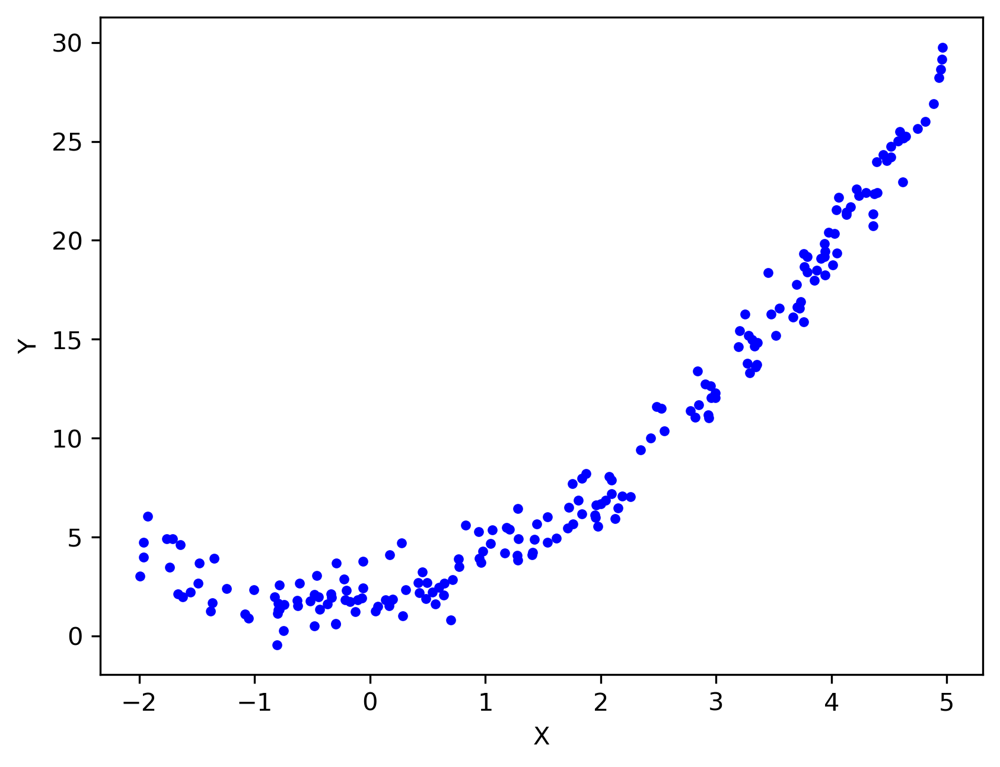

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

X = 7 * np.random.rand(200, 1) - 2
y = 0.9 * X**2 + 0.8*X + 2 + np.random.randn(200, 1)
#equation used -> y = 0.9x^2 + 0.8x + 2
#visualize the data
plt.rcParams['figure.dpi']=300
plt.plot(X, y, 'b.')
plt.xlabel("X")
plt.ylabel("Y")
plt.savefig('Ch5poly1.png')
plt.show()

0.8331219694866657


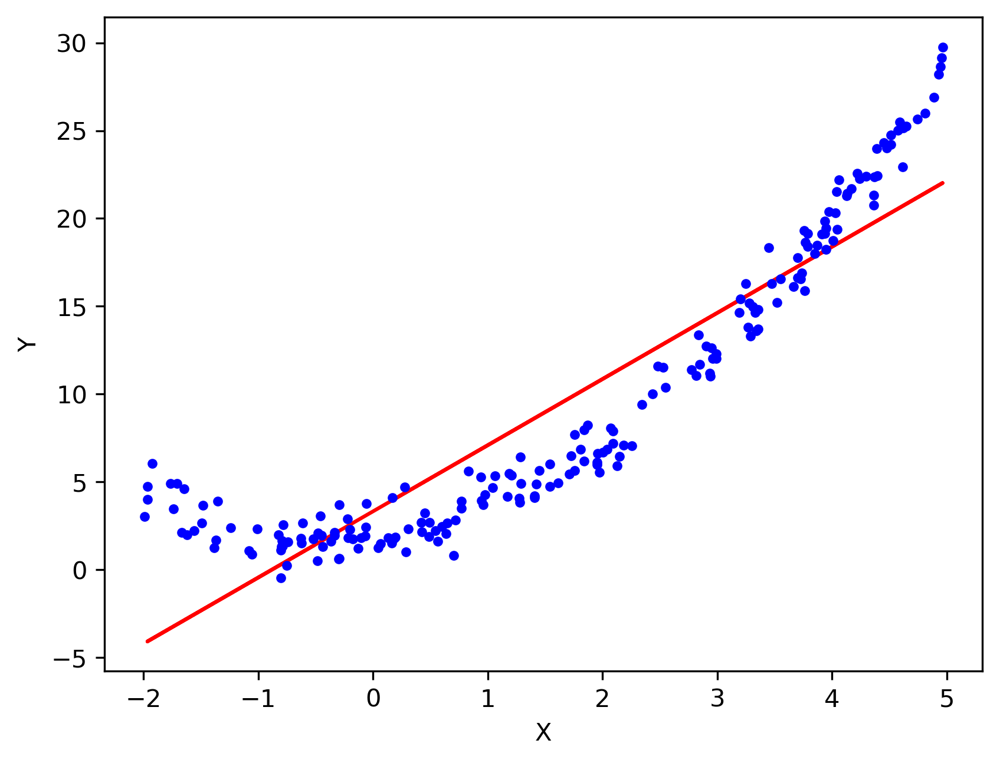

In [2]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

lr = LinearRegression()
lr.fit(x_train, y_train)
y_pred = lr.predict(x_test)
print(r2_score(y_test, y_pred))
plt.rcParams['figure.dpi']=300
plt.plot(x_train, lr.predict(x_train), color="r")
plt.plot(X, y, "b.")
plt.xlabel("X")
plt.ylabel("Y")
plt.savefig('Ch5poly1linfit.png')
plt.show()

R^2 score: 0.9858091508820345
coefficients: [[0.         0.76039903 0.9193462 ]]
intercept: [2.02270954]


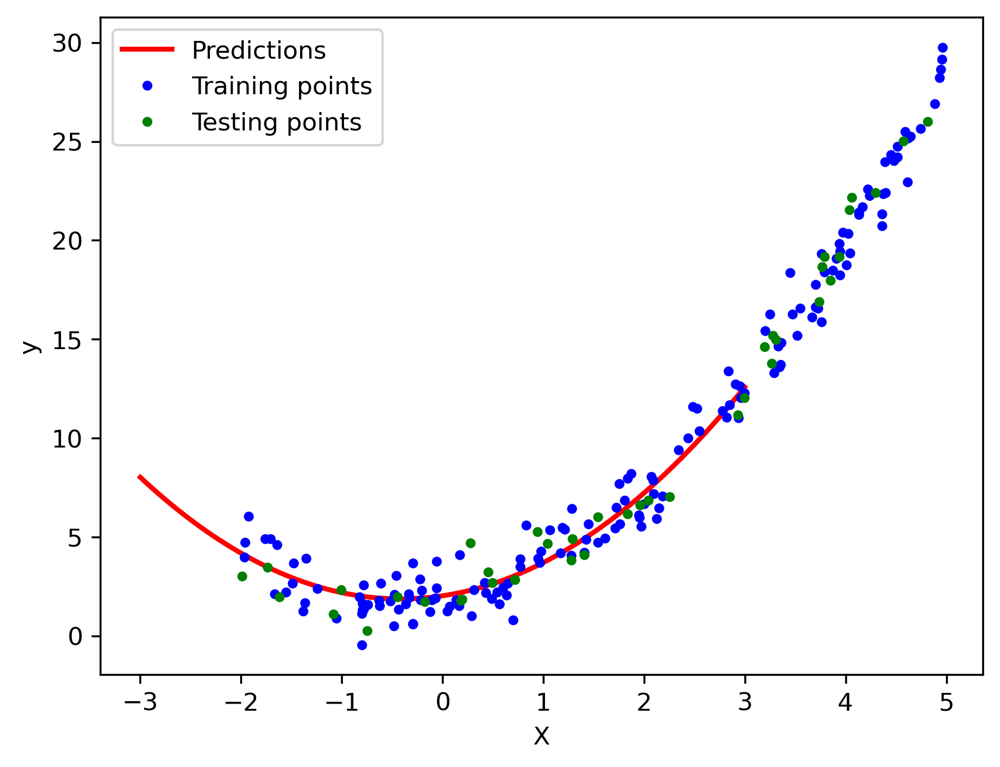

In [3]:
#applying polynomial regression degree 2
poly = PolynomialFeatures(degree=2, include_bias=True)
x_train_trans = poly.fit_transform(x_train)
x_test_trans = poly.transform(x_test)
#include bias parameter
lr = LinearRegression()
lr.fit(x_train_trans, y_train)
y_pred = lr.predict(x_test_trans)
print('R^2 score:',r2_score(y_test, y_pred))

print('coefficients:',lr.coef_)
print('intercept:',lr.intercept_)

X_new = np.linspace(-3, 3, 200).reshape(200, 1)
X_new_poly = poly.transform(X_new)
y_new = lr.predict(X_new_poly)

plt.rcParams['figure.dpi']=300
plt.plot(X_new, y_new, "r-", linewidth=2, label="Predictions")
plt.plot(x_train, y_train, "b.",label='Training points')
plt.plot(x_test, y_test, "g.",label='Testing points')
plt.xlabel("X")
plt.ylabel("y")
plt.legend()
plt.savefig('Ch5polyfit1.png')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


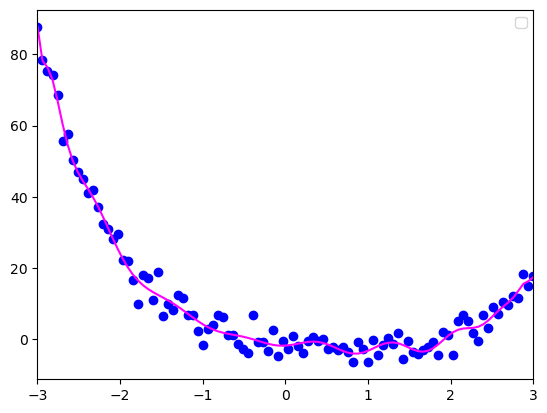

In [39]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
import random
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.linear_model import LinearRegression

n = 4
# Generating synthetic data
np.random.seed(0)  # Seed for reproducibility
X_new = np.linspace(-3, 3, 100).reshape(100, 1)
ydata = 0.5 * X_new**4 - X_new**3 + X_new**2 - 2 * X_new + np.random.randn(100, 1) * 3

PolyFeatures4 = PolynomialFeatures(degree=n)
PolyFeatures25 = PolynomialFeatures(degree=23)
Xnew4 = PolyFeatures4.fit_transform(X_new)
Xnew25 = PolyFeatures25.fit_transform(X_new)
lrpoly = LinearRegression()
lrpoly.fit(Xnew4, ydata)
lrpoly25 = LinearRegression()
lrpoly25.fit(Xnew25, ydata)

y_pred_poly4 = lrpoly.predict(Xnew4)
y_pred_poly25 = lrpoly25.predict(Xnew25)

plt.scatter(X_new, ydata, c='b')
plt.plot(X_new, y_pred_poly25, c='magenta')
#plt.plot(X_new, 0.5 * X_new**4 - X_new**3 + X_new**2 - 2 * X_new, c='green')

#plt.plot(y_pred_poly4)
plt.xlim(-3,3)
plt.legend()
plt.savefig('Ch5polyoverfitn.png')
plt.show()

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
def polynomial_regression(degree):
    X_new=np.linspace(-3, 3, 100).reshape(100, 1)
    X_new_poly = poly.transform(X_new)
    polybig_features = PolynomialFeatures(degree=degree, include_bias=False)
    std_scaler = StandardScaler()
    lin_reg = LinearRegression()
    polynomial_regression = Pipeline([
            ("poly_features", polybig_features),
            ("std_scaler", std_scaler),
            ("lin_reg", lin_reg),
        ])
    polynomial_regression.fit(X, y)
    y_newbig = polynomial_regression.predict(X_new)
    #plotting prediction line
    plt.rcParams['figure.dpi']=300
    plt.plot(X_new, y_newbig,'r', label="Degree " + str(degree), linewidth=2)
    plt.plot(x_train, y_train, "b.", linewidth=3)
    plt.plot(x_test, y_test, "g.", linewidth=3)
    plt.legend(loc="upper left")
    plt.xlabel("X")
    plt.ylabel("y")
    plt.axis([-3, 3, 0, 10])
    plt.savefig('Ch5_polyreg2.png')
    plt.show()

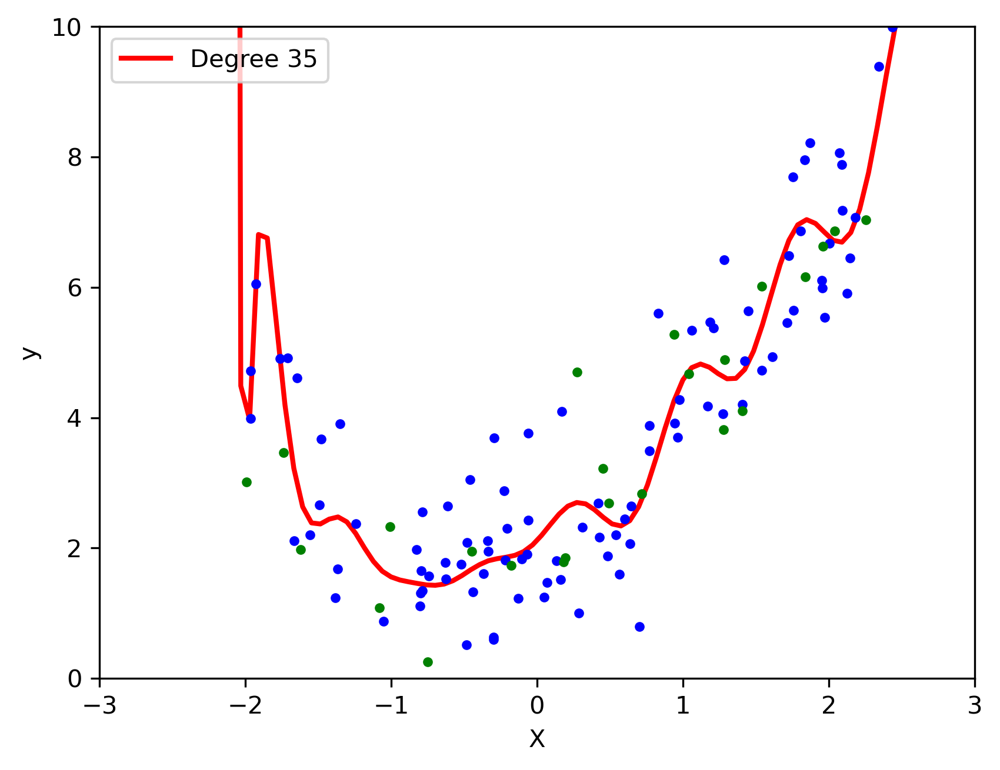

In [5]:
polynomial_regression(35)

In [7]:
import numpy as np
# 3D polynomial regression
x = 7 * np.random.rand(100, 1) - 2.8
y = 7 * np.random.rand(100, 1) - 2.8
z = x**2 + y**2 + 0.3*x + 0.3*y + 0.2*x*y + 3 + np.random.randn(100, 1)

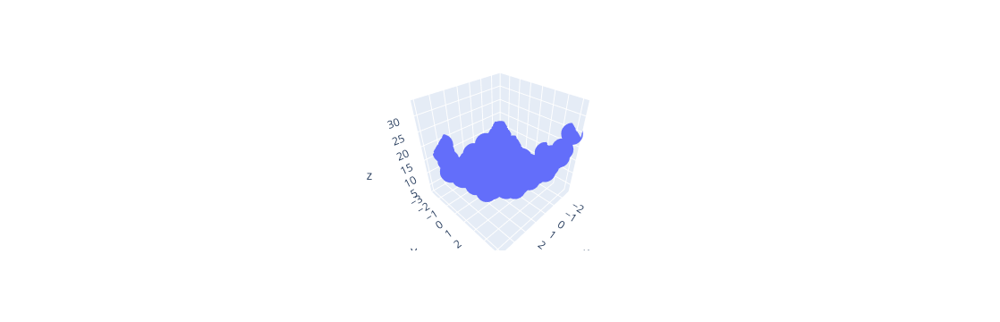

In [8]:
import plotly.express as px
plt.rcParams['figure.dpi']=300
df = px.data.iris()
fig = px.scatter_3d(df, x=x.ravel(), y=y.ravel(), z=z.ravel())
fig.show()

In [11]:
import pandas as pd
#X_multi = np.array([x,y])#.reshape(100,2)
df2 = pd.DataFrame({'x':x, 'y':y})
poly = PolynomialFeatures(degree=2)
X_multi_trans = poly.fit_transform(df2)
#print("Input",poly.n_input_features_)
#print("Ouput",poly.n_output_features_)
#print("Powersn",poly.powers_)

In [7]:
x=x.flatten()
y = y.flatten()

In [8]:
y.shape

(100,)

In [13]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state=1)

In [14]:
lr = LinearRegression()
lr.fit(X_multi_trans, z)
X_test_multi = poly.transform(x_test)
z_final = lr.predict(X_multi_trans).reshape(10,10)

/home/a/Anaconda3/lib/python3.11/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


ValueError: Expected 2D array, got 1D array instead:
array=[ 1.30165223  1.68216282 -0.06857271  0.7858785   3.11144735  3.8305316
  0.4206127   4.06053536  0.61273321 -2.09919435  2.45941021  1.60514542
  1.36787968  0.72927295 -2.52494022 -1.06595839 -1.98872414 -0.77404881
  1.86577001 -1.68383656].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [9]:
import pandas as pd

#Load the College dataset
college_data = pd.read_csv('College.csv')

#Display the first few rows of the dataset
print(college_data.head())

                     Unnamed: 0 Private  Apps  Accept  Enroll  Top10perc  \
0  Abilene Christian University     Yes  1660    1232     721         23   
1            Adelphi University     Yes  2186    1924     512         16   
2                Adrian College     Yes  1428    1097     336         22   
3           Agnes Scott College     Yes   417     349     137         60   
4     Alaska Pacific University     Yes   193     146      55         16   

   Top25perc  F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  Personal  \
0         52         2885          537      7440        3300    450      2200   
1         29         2683         1227     12280        6450    750      1500   
2         50         1036           99     11250        3750    400      1165   
3         89          510           63     12960        5450    450       875   
4         44          249          869      7560        4120    800      1500   

   PhD  Terminal  S.F.Ratio  perc.alumni  Expend  Grad.R

/home/a/Anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/home/a/Anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



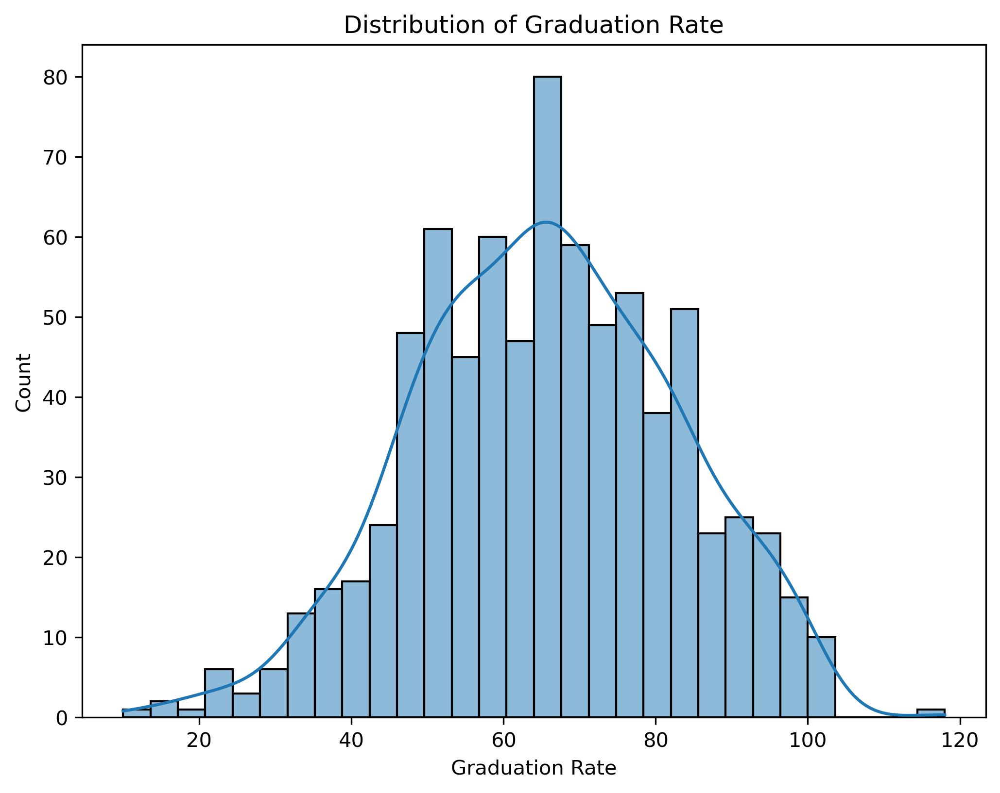

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

#Visualize the distribution of the target variable (Grad.Rate)
plt.rcParams['figure.dpi']=300
plt.figure(figsize=(8, 6))
sns.histplot(data=college_data, x='Grad.Rate', bins=30, kde=True)
plt.title('Distribution of Graduation Rate')
plt.xlabel('Graduation Rate')
plt.ylabel('Count')
plt.savefig('Ch5College_distr.png')
plt.show()

/home/a/Anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/home/a/Anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/home/a/Anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/home/a/Anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/home/a/Anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed 

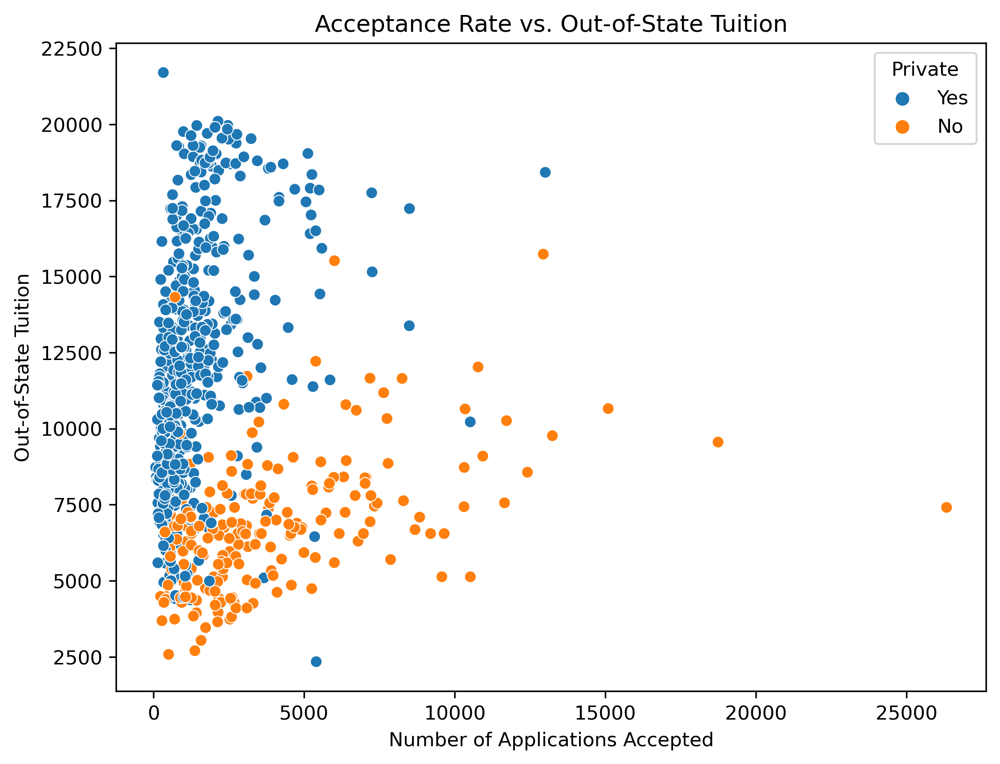

In [11]:
#Visualize the relationship between acceptance rate and tuition fees
plt.figure(figsize=(8, 6))
plt.rcParams['figure.dpi']=300
sns.scatterplot(data=college_data, x='Accept', y='Outstate', hue='Private')
plt.title('Acceptance Rate vs. Out-of-State Tuition')
plt.xlabel('Number of Applications Accepted')
plt.ylabel('Out-of-State Tuition')
plt.savefig('Ch5AcceptTution.png')
plt.show()

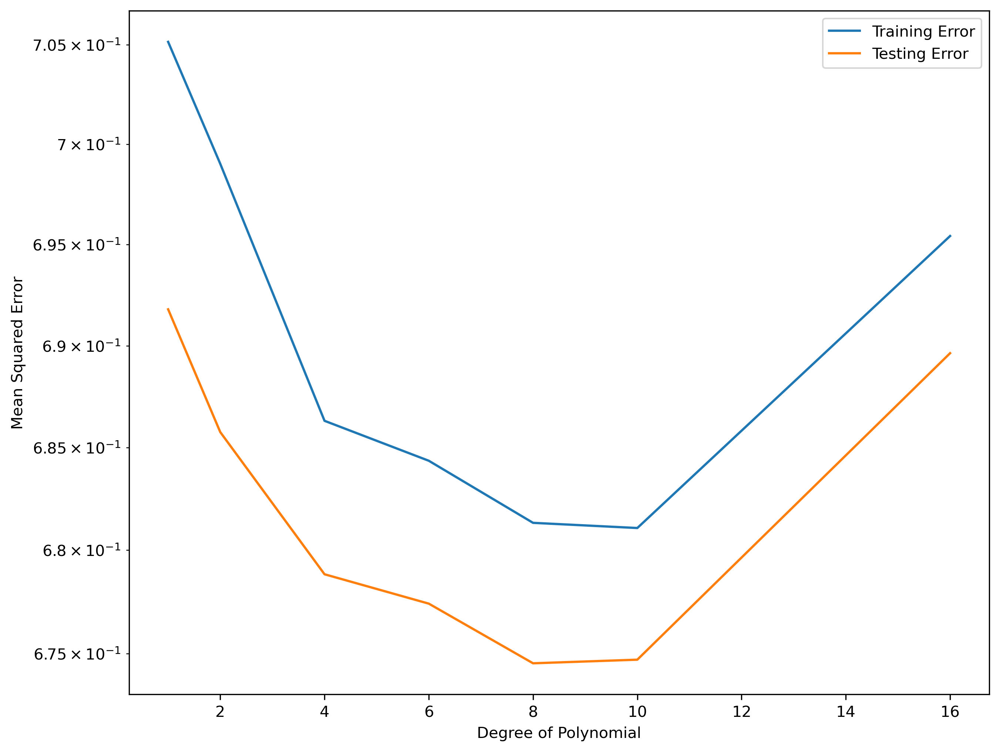

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Load the California Housing dataset
california_dataset = fetch_california_housing()

# For simplicity, let's use 'MedInc' (median income in block) as feature
# and 'Price' (median house value for California districts) as target
X = california_dataset.data[:, np.newaxis, 0]  # MedInc
y = california_dataset.target  # Price

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

degrees = [1, 2, 4, 6, 8, 10, 16]

train_errors = []
test_errors = []

for degree in degrees:
    # Generate polynomial features
    polynomial_features = PolynomialFeatures(degree=degree)
    X_train_poly = polynomial_features.fit_transform(X_train)
    X_test_poly = polynomial_features.transform(X_test)

    # Perform linear regression
    model = LinearRegression()
    model.fit(X_train_poly, y_train)

    # Make predictions
    y_train_pred = model.predict(X_train_poly)
    y_test_pred = model.predict(X_test_poly)

    # Calculate the mean squared error of the training set and test set
    train_error = mean_squared_error(y_train, y_train_pred)
    test_error = mean_squared_error(y_test, y_test_pred)

    train_errors.append(train_error)
    test_errors.append(test_error)

# Plot training errors and test errors
plt.figure(figsize=(10, 8))
plt.rcParams['figure.dpi']=300
plt.plot(degrees, train_errors, label='Training Error')
plt.plot(degrees, test_errors, label='Testing Error')
plt.yscale('log')
plt.xlabel('Degree of Polynomial')
plt.ylabel('Mean Squared Error')
plt.legend()
plt.savefig('Ch5traintest1.png')
plt.show()


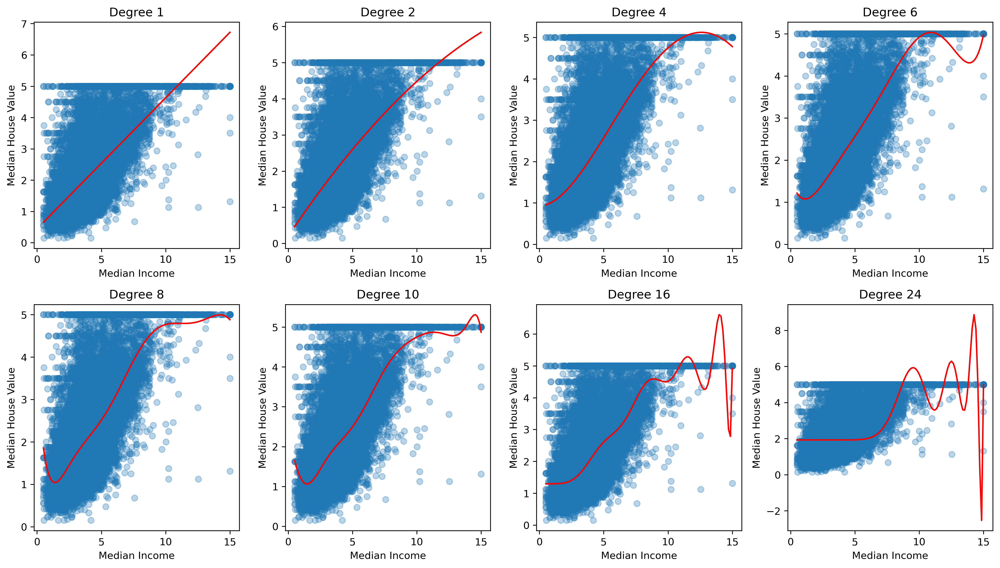

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')

# Load the California Housing dataset
california_dataset = fetch_california_housing()

# Using 'MedInc' (median income in block) as feature and 'Price' (median house value) as target
X = california_dataset.data[:, np.newaxis, 0]  # MedInc
y = california_dataset.target  # Price

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Degrees of polynomial to be tested
degrees = [1, 2, 4, 6, 8, 10, 16, 24]

# Creating subplots
plt.figure(figsize=(14, 8))
plt.rcParams['figure.dpi']=300
for i, degree in enumerate(degrees, 1):
    # Generate polynomial features
    polynomial_features = PolynomialFeatures(degree=degree)
    X_train_poly = polynomial_features.fit_transform(X_train)

    # Perform linear regression
    model = LinearRegression()
    model.fit(X_train_poly, y_train)

    # Creating a range of values for plotting the polynomial curve
    X_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
    X_range_poly = polynomial_features.transform(X_range)

    # Predicting values using the model
    y_range_pred = model.predict(X_range_poly)

    # Plotting
    plt.subplot(2, 4, i)
    plt.scatter(X, y, alpha=0.3)  # Original data points
    plt.plot(X_range, y_range_pred, color='red')  # Polynomial regression curve
    plt.title(f'Degree {degree}')
    plt.xlabel('Median Income')
    plt.ylabel('Median House Value')

plt.tight_layout()
plt.savefig('Ch5polynomial_overfit1.png')
plt.show()


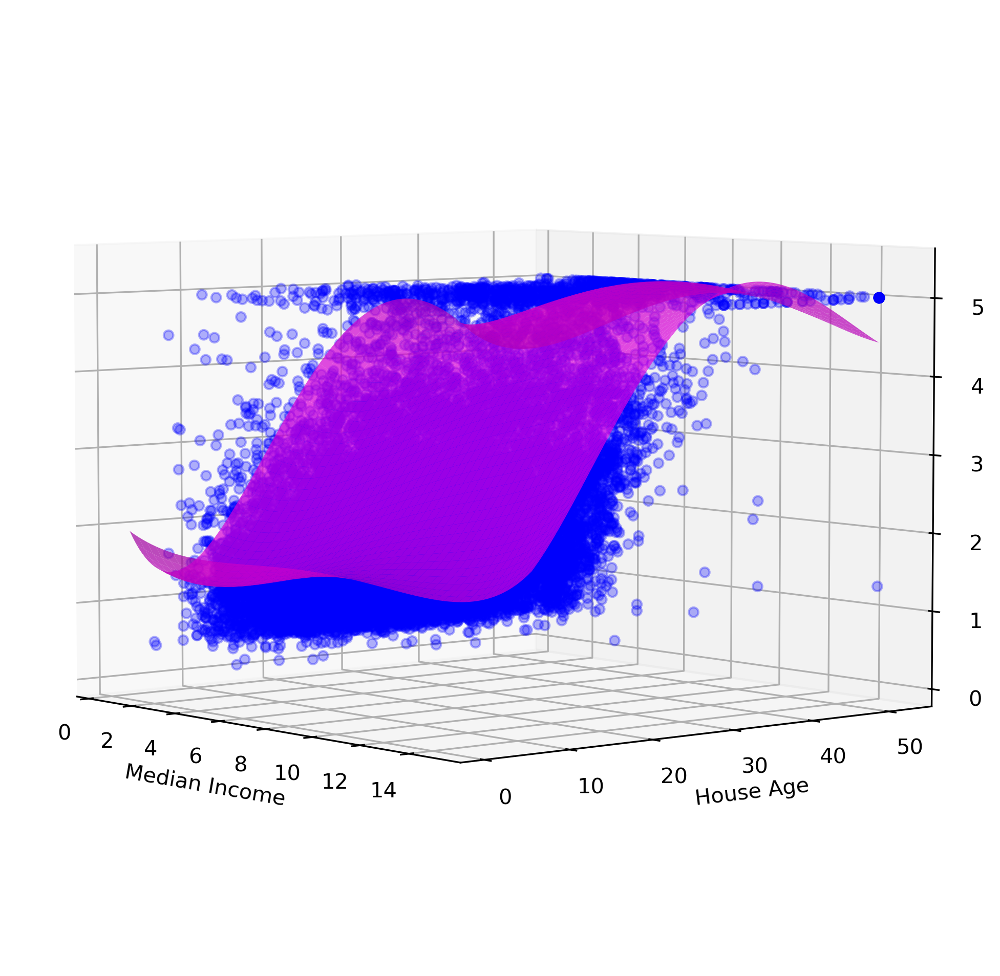

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from mpl_toolkits.mplot3d import Axes3D
import warnings
warnings.filterwarnings('ignore')

# Load the California Housing dataset
california_dataset = fetch_california_housing()

# Using 'MedInc' and 'HouseAge' as features
X = california_dataset.data[:, [0, 1]] # MedInc and HouseAge
y = california_dataset.target # Price

#Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#Polynomial degree
degree = 4 # Example degree

#Generate polynomial features
polynomial_features = PolynomialFeatures(degree=degree)
X_train_poly = polynomial_features.fit_transform(X_train)

#Perform linear regression
model = LinearRegression()
model.fit(X_train_poly, y_train)

#Creating a meshgrid for plotting
x0_range = np.linspace(X[:, 0].min(), X[:, 0].max(), 100)
x1_range = np.linspace(X[:, 1].min(), X[:, 1].max(), 100)
x0, x1 = np.meshgrid(x0_range, x1_range)
X_grid = np.c_[x0.ravel(), x1.ravel()]
X_grid_poly = polynomial_features.transform(X_grid)

#Predicting values using the model
y_grid_pred = model.predict(X_grid_poly).reshape(x0.shape)

#3D Plotting
plt.rcParams['figure.dpi']=300
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Set a different angle using view_init(elev, azim)
# elev stores the elevation angle in the z plane
# azim stores the azimuth angle in the x,y plane
ax.view_init(elev=5, azim=320)  # Change the angle here

ax.scatter(X[:, 0], X[:, 1], y, color='blue', alpha=0.3) # Original data points
ax.plot_surface(x0, x1, y_grid_pred, color='magenta', alpha=0.7) # Polynomial regression surface
ax.set_xlabel('Median Income')
ax.set_ylabel('House Age')
ax.set_zlabel('Median House Value')
#plt.savefig('Ch5CalHouse3D1.png')
plt.show()


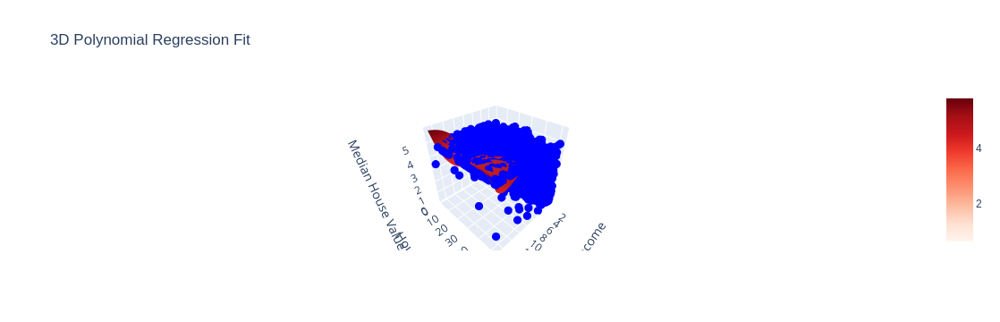

In [24]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')

# Load the California Housing dataset
california_dataset = fetch_california_housing()

# Using 'MedInc' and 'HouseAge' as features
X = california_dataset.data[:, [0, 1]]  # MedInc and HouseAge
y = california_dataset.target  # Price

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Polynomial degree
degree = 5  # Example degree

# Generate polynomial features
polynomial_features = PolynomialFeatures(degree=degree)
X_train_poly = polynomial_features.fit_transform(X_train)

# Perform linear regression
model = LinearRegression()
model.fit(X_train_poly, y_train)

# Creating a meshgrid for plotting
x0_range = np.linspace(X[:, 0].min(), X[:, 0].max(), 100)
x1_range = np.linspace(X[:, 1].min(), X[:, 1].max(), 100)
x0, x1 = np.meshgrid(x0_range, x1_range)
X_grid = np.c_[x0.ravel(), x1.ravel()]
X_grid_poly = polynomial_features.transform(X_grid)

#Predicting values using the model
y_grid_pred = model.predict(X_grid_poly).reshape(x0.shape)

#Create a Plotly figure
fig = go.Figure()

#Add the original data points to the plot
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=y,
mode='markers', marker=dict(size=3, color='blue'),
name='Original Data'))

#Add the polynomial regression surface
fig.add_trace(go.Surface(x=x0, y=x1, z=y_grid_pred, name='Polynomial Fit', colorscale='Reds'))

#Set plot layout
fig.update_layout(title='3D Polynomial Regression Fit',
scene=dict(
xaxis_title='Median Income',
yaxis_title='House Age',
zaxis_title='Median House Value'
),
autosize=True)

#Show the plot
fig.show()

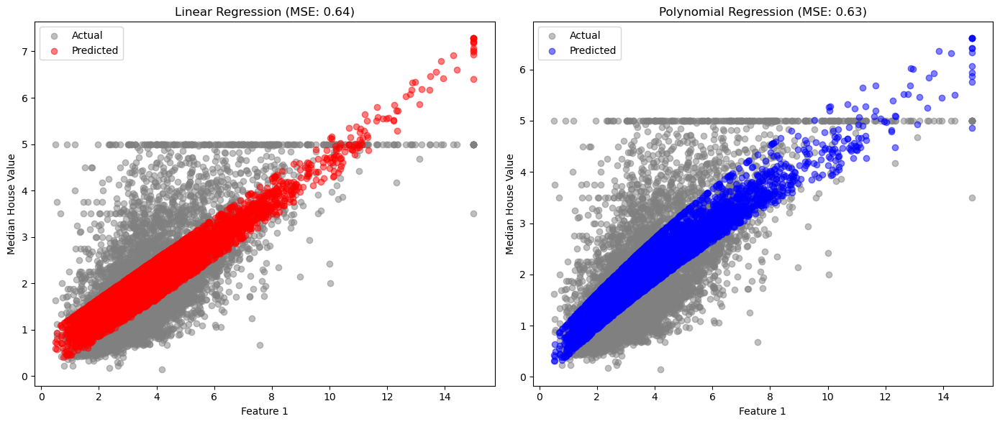

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
import warnings
warnings.filterwarnings('ignore')

# Load California Housing dataset
housing = fetch_california_housing()
X = housing.data[:, :2]  # Using the first two features for simplicity
y = housing.target

# Splitting dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
y_pred_linear = lin_reg.predict(X_test)

# Polynomial Regression
poly_features = PolynomialFeatures(degree=2, include_bias=False)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)
poly_reg = LinearRegression()
poly_reg.fit(X_train_poly, y_train)
y_pred_poly = poly_reg.predict(X_test_poly)

# Calculating errors
linear_mse = mean_squared_error(y_test, y_pred_linear)
poly_mse = mean_squared_error(y_test, y_pred_poly)

# Plotting
plt.figure(figsize=(14, 6))

# Linear Regression plot
plt.subplot(1, 2, 1)
plt.scatter(X_test[:, 0], y_test, color='gray', alpha=0.5, label='Actual')
plt.scatter(X_test[:, 0], y_pred_linear, color='red', alpha=0.5, label='Predicted')
plt.title(f'Linear Regression (MSE: {linear_mse:.2f})')
plt.xlabel('Feature 1')
plt.ylabel('Median House Value')
plt.legend()

# Polynomial Regression plot
plt.subplot(1, 2, 2)
plt.scatter(X_test[:, 0], y_test, color='gray', alpha=0.5, label='Actual')
plt.scatter(X_test[:, 0], y_pred_poly, color='blue', alpha=0.5, label='Predicted')
plt.title(f'Polynomial Regression (MSE: {poly_mse:.2f})')
plt.xlabel('Feature 1')
plt.ylabel('Median House Value')
plt.legend()

plt.tight_layout()
plt.savefig('Ch5trial1.png')
plt.show()

Mean Squared Error (Linear Regression): 14.06
Mean Squared Error (Polynomial Regression): 3.86


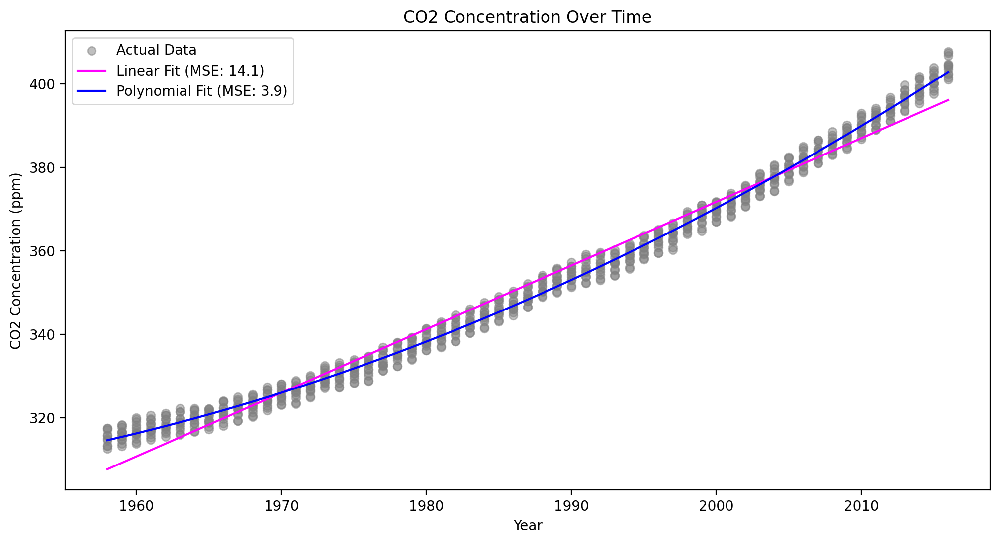

In [17]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import numpy as np
import pandas as pd

# Load Mauna Loa CO2 dataset
url = "https://datahub.io/core/co2-ppm/r/co2-mm-mlo.csv"
df = pd.read_csv('co2-mm-mlo.csv')

# Use year and CO2 as variables
df['Date'] = pd.to_datetime(df['Date'])
df['Year'] = df['Date'].dt.year
X = df[['Year']]
y = df['Interpolated']

# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X, y)
y_pred_linear = lin_reg.predict(X)

# Polynomial Regression
degree = 5
poly_reg = make_pipeline(PolynomialFeatures(degree), LinearRegression())
poly_reg.fit(X, y)
y_pred_poly = poly_reg.predict(X)

# Calculate MSE for Linear Regression
mse_linear = mean_squared_error(y, y_pred_linear)

# Calculate MSE for Polynomial Regression
mse_poly = mean_squared_error(y, y_pred_poly)

# Print MSE for both models
print(f"Mean Squared Error (Linear Regression): {mse_linear:.2f}")
print(f"Mean Squared Error (Polynomial Regression): {mse_poly:.2f}")

# Plotting
plt.rcParams['figure.dpi']=200
plt.figure(figsize=(12, 6))
plt.scatter(X, y, color='gray', alpha=0.5, label='Actual Data')
plt.plot(X, y_pred_linear, color='magenta', label=f'Linear Fit (MSE: {mse_linear:.1f})')
plt.plot(X, y_pred_poly, color='blue', label=f'Polynomial Fit (MSE: {mse_poly:.1f})')
plt.title('CO2 Concentration Over Time')
plt.xlabel('Year')
plt.ylabel('CO2 Concentration (ppm)')
plt.legend()
plt.savefig('Ch5linvspoly.png')
plt.show()

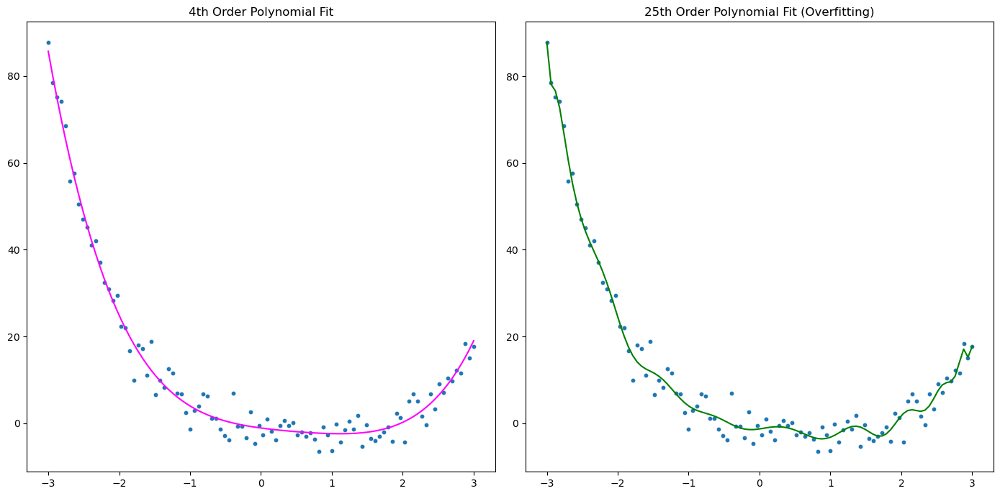

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

# Generating synthetic data
np.random.seed(0)  # Seed for reproducibility
X_new = np.linspace(-3, 3, 100).reshape(100, 1)
y = 0.5 * X_new**4 - X_new**3 + X_new**2 - 2 * X_new + np.random.randn(100, 1) * 3

# Polynomial of 4th order for fitting
degree_4 = 4
polyreg_4 = make_pipeline(PolynomialFeatures(degree_4), LinearRegression())
polyreg_4.fit(X_new, y)

# Polynomial of 25th order for fitting to show overfitting
degree_25 = 25
polyreg_25 = make_pipeline(PolynomialFeatures(degree_25), LinearRegression())
polyreg_25.fit(X_new, y)

# Predictions
X_fit = np.linspace(-3, 3, 100).reshape(100, 1)
y_pred_4 = polyreg_4.predict(X_fit)
y_pred_25 = polyreg_25.predict(X_fit)

# Plotting
plt.figure(figsize=(14, 7))

# Plotting 4th order polynomial fit
plt.subplot(1, 2, 1)
plt.scatter(X_new, y, s=10)
plt.plot(X_fit, y_pred_4, color='magenta')
plt.title('4th Order Polynomial Fit')

# Plotting 25th order polynomial fit to show overfitting
plt.subplot(1, 2, 2)
plt.scatter(X_new, y, s=10)
plt.plot(X_fit, y_pred_25, color='green')
plt.title('25th Order Polynomial Fit (Overfitting)')

plt.tight_layout()
plt.show()

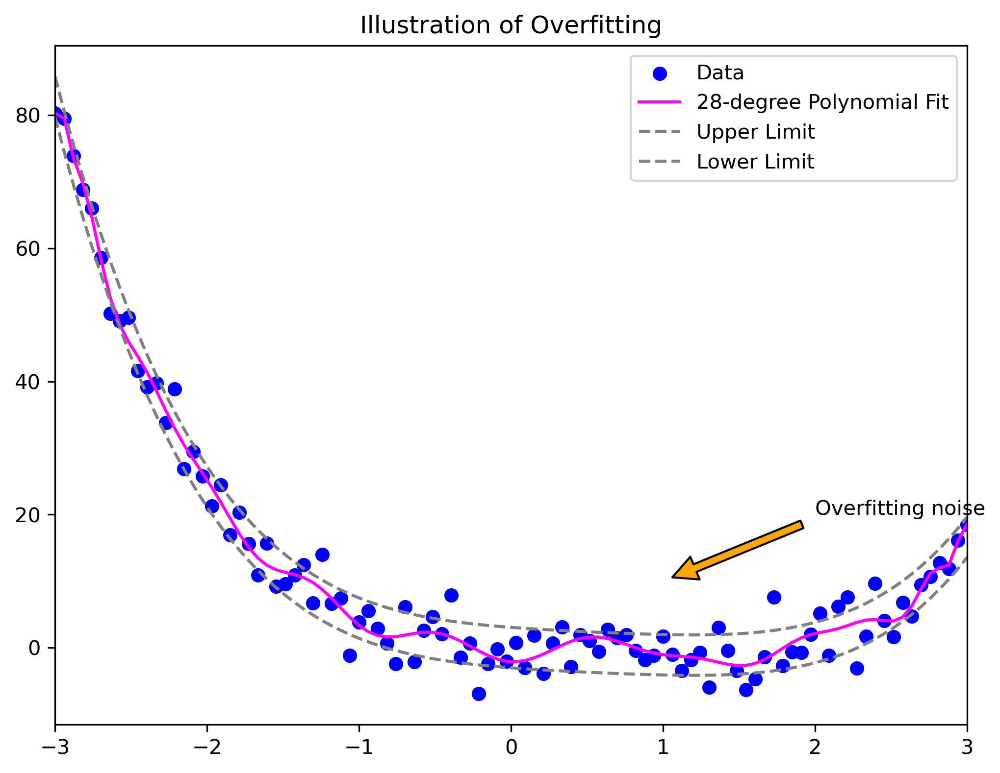

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import matplotlib.patches as mpatches

# Given code
np.random.seed(83597)  # Seed for reproducibility
X_new = np.linspace(-3, 3, 100).reshape(100, 1)
ydata = 0.5 * X_new**4 - X_new**3 + X_new**2 - 2 * X_new + np.random.randn(100, 1) * 3

PolyFeatures4 = PolynomialFeatures(degree=4)
PolyFeatures25 = PolynomialFeatures(degree=28)
Xnew4 = PolyFeatures4.fit_transform(X_new)
Xnew25 = PolyFeatures25.fit_transform(X_new)
lrpoly = LinearRegression()
lrpoly.fit(Xnew4, ydata)
lrpoly25 = LinearRegression()
lrpoly25.fit(Xnew25, ydata)

y_pred_poly4 = lrpoly.predict(Xnew4)
y_pred_poly25 = lrpoly25.predict(Xnew25)

# Calculate the standard deviation of the residuals for the 4-degree polynomial
residuals = ydata - y_pred_poly4
std_dev = np.std(residuals)

# Create the 'bands'
upper_band = y_pred_poly4 + std_dev
lower_band = y_pred_poly4 - std_dev

# Plotting
plt.figure(figsize=(8, 6))
plt.scatter(X_new, ydata, c='b', label='Data')
plt.plot(X_new, y_pred_poly25, c='magenta', label='28-degree Polynomial Fit')

# Add the bands to the plot
plt.plot(X_new, upper_band, c='grey', linestyle='--', label='Upper Limit')
plt.plot(X_new, lower_band, c='grey', linestyle='--', label='Lower Limit')

# Highlight areas where the fit follows the noise
for i in range(len(X_new)):
    if y_pred_poly25[i] > upper_band[i] or y_pred_poly25[i] < lower_band[i]:
        plt.arrow(X_new[i], y_pred_poly25[i], 0, (upper_band[i] - y_pred_poly25[i]) if y_pred_poly25[i] > upper_band[i] else (lower_band[i] - y_pred_poly25[i]),
                  head_width=0.1, head_length=0.5, fc='orange', ec='orange')

# Annotate overfitting areas
plt.rcParams['figure.dpi']=300
plt.annotate('Overfitting noise', xy=(1, 10), xytext=(2, 20),
             arrowprops=dict(facecolor='orange', shrink=0.06))

plt.xlim(-3,3)
plt.legend()
plt.title('Illustration of Overfitting')
plt.savefig('Ch5polyoverfit3.png')
plt.show()